# Project Plots

A step-by-step guide to generating all plots in the Team 19 presentation (ECE143 FA20).

## Box and Whisker plots  
As is done in `box_and_whisker.py`.  
### Module Imports  
Importing numpy, pandas, and custom functions needed for this script

In [26]:
try:
    import numpy as np
    import pandas as pd
    # conda install seaborn
    #import seaborn as sns
    import matplotlib.pyplot as plt
    #ensure file bw_functions.py is in same directory as box_and_whisker.py
    from Source_Code.project_functions import merge_MinMax_Salary, count_members_by_column, clean_and_merge, gen_and_disp_boxWhiskerPlot
except Exception as e:
    print("some modules are missing, try installing third party modules and check that project_functions.py is accessable")

### Clean & Format Data  
Importing data from csv files as dataframes, cleaning and merging the data.

In [27]:
##===================READ CSV DATA IN AS DATAFRAMES===================##
col_list = ["Job_title","Company","State","City","Min_Salary","Max_Salary","Job_Desc","Industry","Rating","Date_Posted","Valid_until","Job_Type"]
files_list = ["Source_Code/Data_Job_NY.csv"
                ,"Source_Code/Data_Job_SF.csv"
                ,"Source_Code/Data_Job_TX.csv"
                ,"Source_Code/Data_Job_WA.csv"]
df_NY = pd.read_csv(files_list[0],usecols=col_list)
df_SF = pd.read_csv(files_list[1],usecols=col_list)
df_TX = pd.read_csv(files_list[2],usecols=col_list)
df_WA = pd.read_csv(files_list[3],usecols=col_list)

##===================CLEAN DATA===================##
##===================JOIN ALL DATAFRAMES===================##
df_allFrames = [df_NY, df_SF, df_TX, df_WA]
df_combined = clean_and_merge(df_allFrames) # project_functions

### Count Occurances of Industries  
This dictates which industries we will merge into the plotting function.  
*Notice this is done before we* `merge_minMax_Salary()` *since this doubles the number of rows*. 

In [28]:
##===================Uncomment below to COUNT NUMBER OF POSTS BY INDUSTRY===================##
## to print to console uncommend the next line and run script
#print(count_members_by_column(df_combined,"Industry")) # project_functions
## to write count to csv uncomment next 2 lines and run script
#df_coCount = count_members_by_column(df_combined,"Industry") # project_functions
#df_coCount.to_csv('Data_Industry_Count.csv')

### Create Dataframe to of Top 5 Industries only
We create a new dataframe with only the top 5 industries for which we want to plot salary

In [29]:
##===================CREATE DF W/ONLY TOP 5 INDUSTRIES WRT # OF POSTS===================##
df_combFinance = df_combined[df_combined["Industry"]=="Aerospace & Defense"]
df_combHealthcare = df_combined[df_combined["Industry"]=="Finance"]
df_combBiotech = df_combined[df_combined["Industry"]=="Biotech & Pharmaceuticals"]
df_combBusiness = df_combined[df_combined["Industry"]=="Business Services"]
df_combInfoTech = df_combined[df_combined["Industry"]=="Information Technology"]
frames_topInd = [df_combFinance, df_combHealthcare, df_combBiotech, df_combBusiness, df_combInfoTech]
df_combInd = pd.concat(frames_topInd)

### Visualization Specific Data Manipulation  
now we create a dataframe with all salary data in one column with a new column that indicates whether it is a min or max salary

In [30]:
##===================MERGE DF SALARY COLUMNS INTO ONE, CREATE MIN_MAX COL===================##
df_minmaxInd = merge_MinMax_Salary(df_combInd) # project_functions

### Count Occurances of Companies
We do this now to see which companies post out of the top 5 remaining.  

In [31]:
##===================Uncomment below to COUNT NUMBER OF POSTS BY COMPANY===================##
## to print to console uncommend the next line and run script
#print(count_members_by_column(df_combInd,"Company")) # project_functions
## to write count to csv uncomment next 2 lines and run script
#df_coCount = count_members_by_column(df_combInd,"Company") # project_functions
#df_coCount.to_csv('Data_Company_Count.csv')

### Create Dataframes to Plot Salary vs Company  
We create a new dataframe from these counts

In [32]:
##===================CREATE DF W/ONLY TOP 5 COMPANIES WRT # OF POSTS===================##
df_combAmazon = df_combInd[df_combInd["Company"]=="Amazon"]
df_combFacebook = df_combInd[df_combInd["Company"]=="Facebook"]
df_combLeidos = df_combInd[df_combInd["Company"]=="Leidos"]
df_combGenentech = df_combInd[df_combInd["Company"]=="Genentech"]
df_combNatDebtRel = df_combInd[df_combInd["Company"]=="National Debt Relief"]
frames_Co = [df_combAmazon, df_combFacebook, df_combLeidos, df_combGenentech, df_combNatDebtRel]
df_combCo = pd.concat(frames_Co)

### Visualization Specific Data Manipulation (for Company this time) 
now we create a dataframe with all salary data in one column with a new column that indicates whether it is a min or max salary

In [33]:
##===================MERGE DF SALARY COLUMNS INTO ONE, CREATE MIN_MAX COL===================##
df_minmaxCo = merge_MinMax_Salary(df_combCo) # project_functions

### Create Filters for Both Plots
IQR stands for Interquartile range, and is used in defining bounds of the Box and Whisker plots

In [34]:
##===================FILTER OUTLIERS===================##
Q1 = df_minmaxInd['Salary'].quantile(0.25)
Q3 = df_minmaxInd['Salary'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
filter = (df_minmaxInd['Salary'] >= Q1 - 1.5 * IQR) & (df_minmaxInd['Salary'] <= Q3 + 1.5 *IQR)
df_minmaxInd.loc[filter]  
Q1 = df_minmaxCo['Salary'].quantile(0.25)
Q3 = df_minmaxCo['Salary'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
filter = (df_minmaxCo['Salary'] >= Q1 - 1.5 * IQR) & (df_minmaxCo['Salary'] <= Q3 + 1.5 *IQR)
df_minmaxCo.loc[filter] 

,Job_title,Company,State,City,Salary,Job_Desc,Industry,Rating,Date_Posted,Valid_until,Job_Type,Min_Max
10,Senior Data Scientist,Amazon,VA,Herndon,114390,This company is in a hiring surge in response ...,Information Technology,3.9,2020-05-06,2020-06-06,FULL_TIME,min
172,Sr. Data Engineer,Amazon,VA,Herndon,91919,This company is in a hiring surge in response ...,Information Technology,3.9,2020-04-25,2020-06-06,FULL_TIME,min
216,Security Data Scientist,Amazon,VA,Herndon,95511,This company is in a hiring surge in response ...,Information Technology,3.9,2020-05-01,2020-06-06,FULL_TIME,min
278,Senior Applied Education and Measurement Scien...,Amazon,DC,Washington,131982,This company is in a hiring surge in response ...,Information Technology,3.9,2020-05-07,2020-06-06,FULL_TIME,min
330,Machine Learning Applied Scientist,Amazon,VA,Herndon,122139,This company is in a hiring surge in response ...,Information Technology,3.9,2020-05-02,2020-06-06,FULL_TIME,min
...,...,...,...,...,...,...,...,...,...,...,...,...
1887,Paid Search Director,National Debt Relief,NY,New York,114484,Who We're Looking For:\r\n\r\nNational Debt Re...,Finance,4.0,2020-04-25,2020-06-07,FULL_TIME,max
1889,Senior Salesforce Developer,National Debt Relief,NY,New York,82162,Principle Duties & Responsibilities:\r\n\r\nAn...,Finance,4.0,2020-05-08,2020-06-07,FULL_TIME,max
1891,Paid Search Director,National Debt Relief,NY,New York,114484,Who We're Looking For:\r\n\r\nNational Debt Re...,Finance,4.0,2020-04-25,2020-06-07,FULL_TIME,max
1893,Senior Salesforce Developer,National Debt Relief,NY,New York,82162,Principle Duties & Responsibilities:\r\n\r\nAn...,Finance,4.0,2020-05-08,2020-06-07,FULL_TIME,max


### Create & Display Plots  
Now we can display the plots from our latest dataframes

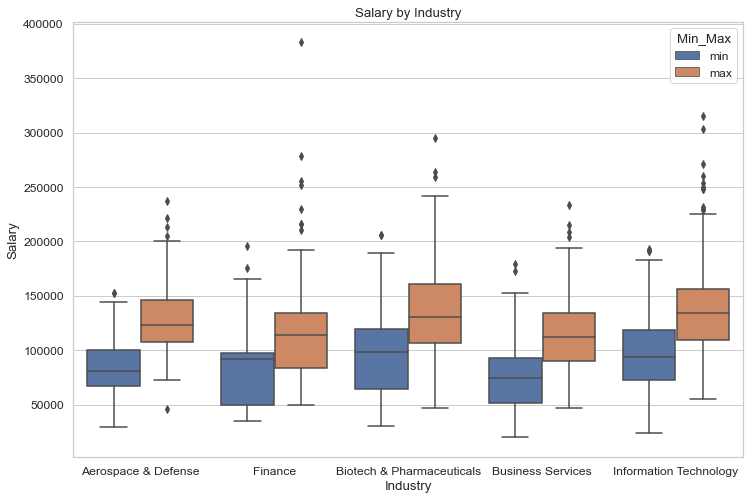

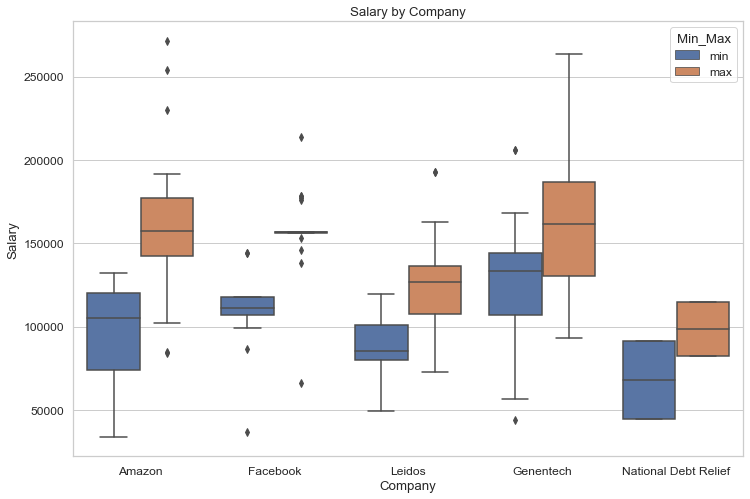

In [35]:
##===================CREATE & DISPLAY BOX & WHISKER PLOTS===================##
# display Min and Max Salary vs Industry
gen_and_disp_boxWhiskerPlot(df_minmaxInd,"Salary by Industry","Industry","Salary","Min_Max") # project_functions
# display Min and Max Salary vs Company
gen_and_disp_boxWhiskerPlot(df_minmaxCo,"Salary by Company","Company","Salary","Min_Max") # project_functions

## Word Cloud Plots  
As is done in `word_clouds.py`.  

### Module Imports  
Importing numpy, pandas, and custom functions needed for this script

In [40]:
try:
    import numpy as np
    import pandas as pd
    #ensure file project_functions.py is in same dir as word_clouds.py
    from Source_Code.project_functions import remove_non_keywords, create_JobDescription_string, generate_and_display_wordcloud, clean_and_merge
except Exception as e:
    print("some modules are missing, check that project_functions.py is accessable")

### Clean & Format Data  
Using `df_combined` dataframe from previous part

### Create Job Description Strings by Industry  
Using `create_JobDescription_string()` from project functions, feed all words in the job description column into a huge string for use in the wordcloud; we will filter these later. This is done for specific values in a column specified in the function.

In [41]:
##===================CREATE JOB DESCRIPTION STRINGS BY INDUSTRY===================##
## Aerospace
str_Aero = create_JobDescription_string(df_combined,"Industry","Aerospace & Defense") # project_functions
## Finance 
str_Finance = create_JobDescription_string(df_combined,"Industry","Finance") # project_functions
## Biotech
str_Biotech = create_JobDescription_string(df_combined,"Industry","Biotech & Pharmaceuticals") # project_functions
## Business
str_Business = create_JobDescription_string(df_combined,"Industry","Business Services") # project_functions
## IT
str_IT = create_JobDescription_string(df_combined,"Industry","Information Technology") # project_functions

### Filter Job Description Strings
1. Create list of keywords that we want to keep in the string
2. use `remove_non_keywords()` from project functions to filter the string before use in wordcloud.

In [42]:
##===================CREATE LIST OF 'KEYWORDS'===================##
keyword_list = ["models","statistics","probability","machine learning","data science","numpy","pandas","sql","scikit-learn","r","databases","database","team",
"MSc","PhD","mathematics","computer science","physics","research","data","relational databases","python","c++","matlab","modeling","dbt","snowflake",
"mode analytics","fivetran","Census","amplitude","segment","tensorflow","optimization","prediction","engineering","data engineering","neural networks",
"bigquery","pyspark","degree","bachelor","bachelors","scala","data analysis","analysis","data visualization","algorithms","classification",
"model","java","javascript","caffe","deep learning","data processing","hpc","hadoop","ms","bs","m.s.","b.s.","masters","master","stem","postgres",
"software development","agile","querying","experience","skills","credentials","hands-on","communication","presentation","ownership"]

##===================REMOVE ALL NON-KEYWORDS FROM STRINGS===================##
## Aerospace
str_Aero = remove_non_keywords(str_Aero, keyword_list) # project_functions
## Finance 
str_Finance = remove_non_keywords(str_Finance, keyword_list) # project_functions
## Biotech
str_Biotech = remove_non_keywords(str_Biotech, keyword_list) # project_functions
## Business
str_Business = remove_non_keywords(str_Business, keyword_list) # project_functions
## IT
str_IT = remove_non_keywords(str_IT, keyword_list) # project_functions

### Create & Display Industry Plots
Now we can use `generate_and_display_wordcloud()` to display the wordcloud plot for our top Industries.  
*Notice: we will need to have installed wordcloud module/library as mentioned in the README.md* 
*In Terminal:* `conda install -c conda-forge wordcloud` to install wordcloud

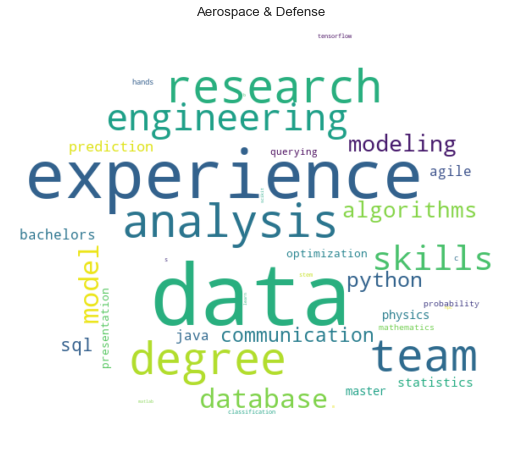

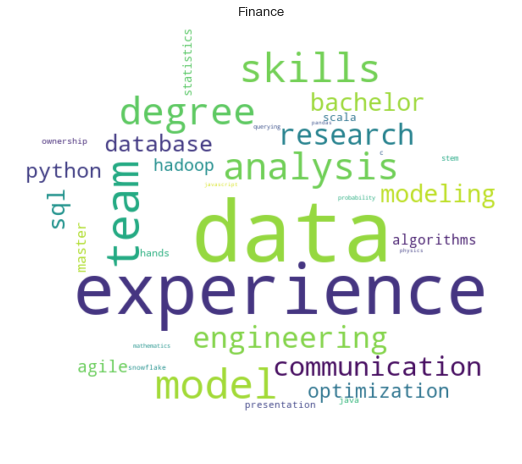

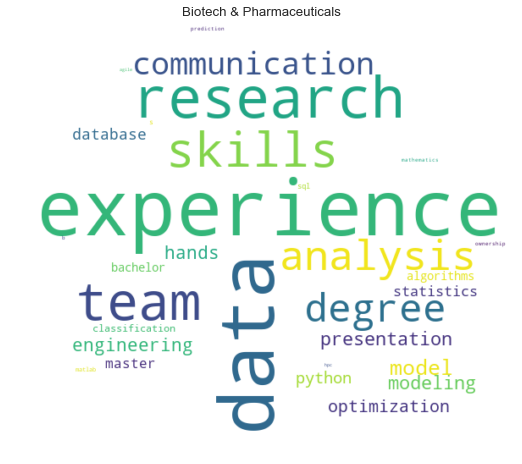

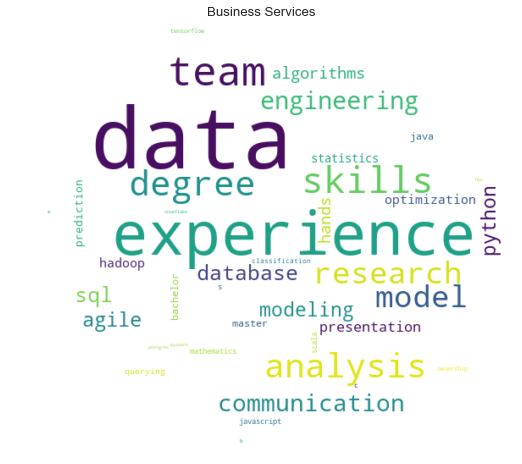

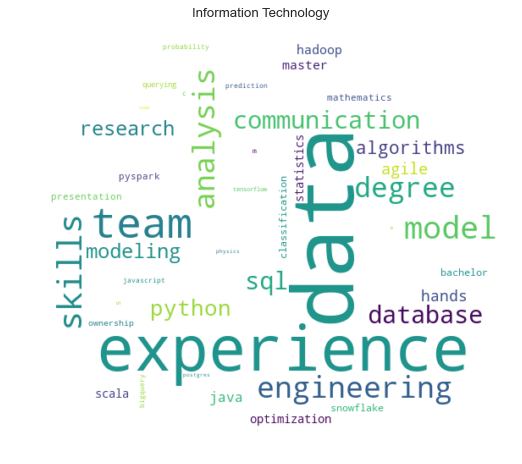

In [43]:
##===================CREATE & DISPLAY WORDCLOUDS FOR INDUSTRIES===================##
## Aerospace
generate_and_display_wordcloud(str_Aero,"Aerospace & Defense","Source_Code/cloud.png") #8iGbRApyT.png")
## Finance
generate_and_display_wordcloud(str_Finance,"Finance","Source_Code/cloud.png") #dollar.jpg")
## Biotech
generate_and_display_wordcloud(str_Biotech,"Biotech & Pharmaceuticals","Source_Code/cloud.png") #flask.jpg")
## Business
generate_and_display_wordcloud(str_Business,"Business Services","Source_Code/cloud.png") #tie.jpg")
## IT
generate_and_display_wordcloud(str_IT,"Information Technology","Source_Code/cloud.png") #cursor.jpg")

### Create Job Description Strings by Company  
Using `create_JobDescription_string()` from project functions, feed all words in the job description column into a huge string for use in the wordcloud; we will filter these later. This is done for specific values in a column specified in the function ('Company' this time).

In [25]:
##===================CREATE JOB DESCRIPTION STRINGS BY COMPANY===================##
## Facebook
str_Facebook = create_JobDescription_string(df_combined,"Company","Facebook")
## Amazon 
str_Amazon = create_JobDescription_string(df_combined,"Company","Amazon")
## Leidos
str_Leidos = create_JobDescription_string(df_combined,"Company","Leidos")
## Genentech
str_Genentech = create_JobDescription_string(df_combined,"Company","Genentech")
## National Debt Relief
str_National = create_JobDescription_string(df_combined,"Company","National Debt Relief")

### Filter Job Description Strings  
Use `remove_non_keywords()` from project functions to filter the string before use in wordcloud.

In [26]:
##===================REMOVE ALL NON-KEYWORDS FROM STRINGS===================##
## Facebook
#str_Facebook = remove_non_keywords(str_Facebook, keyword_list)
""" Facebook is covid surge listing--not useful, therefore not plotted """
## Amazon 
#str_Amazon = remove_non_keywords(str_Amazon, keyword_list)
""" Amazon is covid surge listing--not useful, therefore not plotted """
## Leidos
#str_Leidos = remove_non_keywords(str_Leidos, keyword_list)
""" Leidos is covid surge listing--not useful, therefore not plotted """
## Genentech
str_Genentech = remove_non_keywords(str_Genentech, keyword_list)
## National Debt Relief
str_National = remove_non_keywords(str_National, keyword_list)

### Create & Display Company Plots
Now we can use `generate_and_display_wordcloud()` to display the wordcloud plot for our top Companies. 

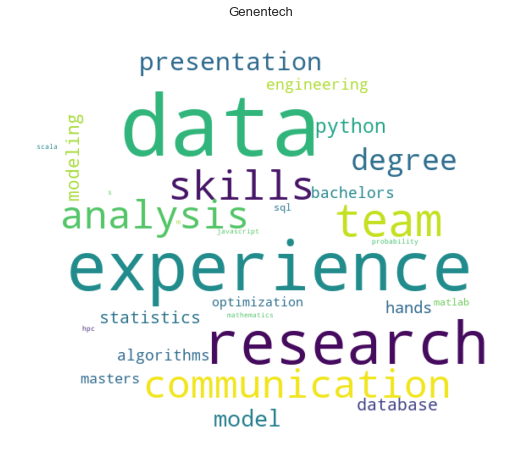

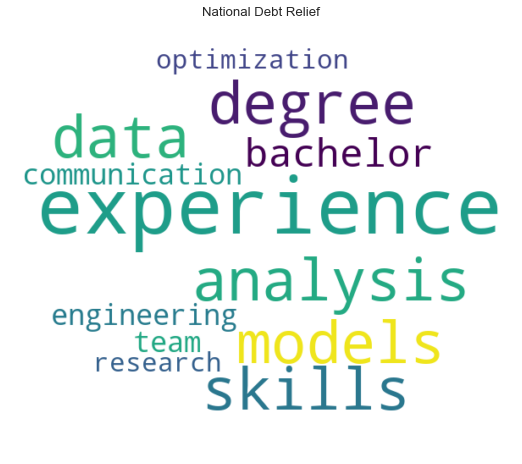

In [27]:
##===================CREATE & DISPLAY WORDCLOUDS FOR COMPANIES===================##
## Facebook
#generate_and_display_wordcloud(str_Facebook,"Facebook","Source_Code/cloud.png") #8iGbRApyT.png")
""" Facebook is covid surge listing--not useful, therefore not plotted """
## Amazon
#generate_and_display_wordcloud(str_Amazon,"Amazon","Source_Code/cloud.png") #dollar.jpg")
""" Amazon is covid surge listing--not useful, therefore not plotted """
## Leidos
#generate_and_display_wordcloud(str_Leidos,"Leidos","Source_Code/cloud.png") #flask.jpg")
""" Leidos is covid surge listing--not useful, therefore not plotted """
## Genetech
generate_and_display_wordcloud(str_Genentech,"Genentech","Source_Code/cloud.png") #cursor.jpg")
## National Debt Relief
generate_and_display_wordcloud(str_National,"National Debt Relief","Source_Code/cloud.png") #tie.jpg")

## Scatter Plots
First, we import the needed modules, the scatterplots use the `altair module` to create the plots. Then, to get the data ready we use `clean_data()` from project_functions.py to filter out bad data. We then put all the resulting DataFrames into a list for later use in `merge_field()`, where we can merge the DataFrames into a dictionary of DataFrames sorted by a certain column in the DataFrame. In this case we sort by Industry and Company.

In [1]:
#========= DATA FOR SCATTERPLOTS TO PLOT =========#
from altair import Chart
import altair as alt
import pandas as pd
from Source_Code.project_functions import clean_data, merge_field, salary_v_rating_scatter, salary_v_listings_scatter 

# Read csv files into dataframes
sf = pd.read_csv(r'Source_Code/Data_Job_SF.csv')
ny = pd.read_csv(r'Source_Code/Data_Job_NY.csv')
tx = pd.read_csv(r'Source_Code/Data_Job_TX.csv')
wa = pd.read_csv(r'Source_Code/Data_Job_WA.csv')

# Filter the data and combine them
sf_clean = clean_data(sf)
wa_clean = clean_data(wa)
tx_clean = clean_data(tx)
ny_clean = clean_data(ny)
df_clean = [sf_clean,wa_clean,tx_clean,ny_clean]

### Salary vs Company Ratings Scatterplot by Industry

In [3]:
# Choose how we want data to be organized
mdict = merge_field('Industry',df_clean)

# Choose what entries we specifcally want to plot
df_chart = pd.concat([mdict['Information Technology'], mdict['Business Services'], mdict['Biotech & Pharmaceuticals'],
                     mdict['Finance'], mdict['Aerospace & Defense']],
                    ignore_index=True)

# Create and display plot
chart = salary_v_rating_scatter(df_chart, 'Industry',True)
chart

alt.Chart(...)

### Salary vs Company Ratings Scatterplot by Company

In [4]:
# Choose how we want data to be organize
mdict = merge_field('Company',df_clean)

# Choose what entries we specifcally want to plot
df_chart = pd.concat([mdict['Genentech'], mdict['Leidos'], 
                      mdict['Amazon'], mdict['Facebook'], mdict['Booz Allen Hamilton'],
                     mdict['Capital One'], mdict['BAE Systems USA']],
                    ignore_index=True)

# Create and display plot
chart = salary_v_rating_scatter(df_chart, 'Company')
chart

alt.Chart(...)

### Salary vs Job Listings Scatterplot

In [5]:
# Choose how we want data to be organize
mdict = merge_field('Industry',df_clean)

# Choose what entries we specifcally want to plot
df_chart = pd.concat([mdict['Information Technology'], mdict['Business Services'], mdict['Biotech & Pharmaceuticals'],
                     mdict['Aerospace & Defense'], mdict['Finance'], mdict['Health Care']],
                    ignore_index=True)

# Create and display plot
chart = salary_v_listings_scatter(df_chart, 'Industry')
chart

alt.Chart(...)

## Radial Column Chart Plot

### Module Imports
Importing numpy, pandas, and custom functions needed for this script

In [21]:
import numpy as np
import pandas as pd

from collections import OrderedDict
from bokeh.plotting import figure, output_file, show
from Source_Code.project_functions import merge_MinMax_Salary, count_members_by_column, clean_and_merge, plot_radial_column_chart

### Clean & Format Data  
Importing data from csv files as dataframes, cleaning and merging the data.

In [22]:
##===============Load Data =======================##

col_list = ["Job_title","Company","State","City","Min_Salary","Max_Salary","Job_Desc","Industry","Rating","Date_Posted","Valid_until","Job_Type"]
files_list = ["Source_Code/Data_Job_NY.csv"
                ,"Source_Code/Data_Job_SF.csv"
                ,"Source_Code/Data_Job_TX.csv"
                ,"Source_Code/Data_Job_WA.csv"]
df_NY = pd.read_csv(files_list[0],usecols=col_list)
df_SF = pd.read_csv(files_list[1],usecols=col_list)
df_TX = pd.read_csv(files_list[2],usecols=col_list)
df_WA = pd.read_csv(files_list[3],usecols=col_list)

##===================CLEAN DATA===================##
##===================JOIN ALL DATAFRAMES===================##
df_allFrames = [df_NY, df_SF, df_TX, df_WA]
df_combined = clean_and_merge(df_allFrames)
df_minmax = merge_MinMax_Salary(df_combined)

df_minmaxAerospace = df_minmax[df_minmax["Industry"]=="Aerospace & Defense"]
#df_minmaxAerospace.to_csv('Aerospace.csv')
df_minmaxFinance = df_minmax[df_minmax["Industry"]=="Finance"]
df_minmaxBiotech = df_minmax[df_minmax["Industry"]=="Biotech & Pharmaceuticals"]
df_minmaxBusiness = df_minmax[df_minmax["Industry"]=="Business Services"]
df_minmaxInfoTech = df_minmax[df_minmax["Industry"]=="Information Technology"]


### Find top 3 companys
Finding the top 3 companys that have the most job posting for each industries by counting occurance

In [23]:
top_companies_num = 3
top_company_Aerospace_dict = {}
top_company_Aerospace = list(df_minmaxAerospace['Company'].value_counts(sort=True).index[0:3])
top_company_Aerospace_count = df_minmaxAerospace['Company'].value_counts(sort=True)[0:3].values
for i in range(top_companies_num):
    top_company_Aerospace_dict[top_company_Aerospace[i]] = top_company_Aerospace_count[i]
#print('Asrospace',top_company_Aerospace_dict)    

top_company_Finance_dict = {}
top_company_Finance = list(df_minmaxFinance['Company'].value_counts(sort=True).index[0:3])
top_company_Finance_count = df_minmaxFinance['Company'].value_counts(sort=True)[0:3].values
for i in range(top_companies_num):
    top_company_Finance_dict[top_company_Finance[i]] = top_company_Finance_count[i]
#print('Finance',top_company_Finance_dict)    


top_company_Biotech_dict = {}
top_company_Biotech = list(df_minmaxBiotech['Company'].value_counts(sort=True).index[0:3])
top_company_Biotech_count = df_minmaxBiotech['Company'].value_counts(sort=True)[0:3].values
for i in range(top_companies_num):
    top_company_Biotech_dict[top_company_Biotech[i]] = top_company_Biotech_count[i]
#print('Biotech',top_company_Biotech_dict)    

# get rid of repeated companys
top_company_Business_dict = {}
top_company_Business = list(df_minmaxBusiness['Company'].value_counts(sort=True).index[0:4])
top_company_Business_count = df_minmaxBusiness['Company'].value_counts(sort=True)[0:4].values
for i in range(top_companies_num + 1):
    top_company_Business_dict[top_company_Business[i]] = top_company_Business_count[i]
#print('Business',top_company_Business_dict) 

top_company_InfoTech_dict = {}
top_company_InfoTech = list(df_minmaxInfoTech['Company'].value_counts(sort=True).index[0:3])
top_company_InfoTech_count = df_minmaxInfoTech['Company'].value_counts(sort=True)[0:3].values
for i in range(top_companies_num):
    top_company_InfoTech_dict[top_company_InfoTech[i]] = top_company_InfoTech_count[i]
#print('InfoTech',top_company_InfoTech_dict) 

## Calculate the salaries
calculate the average salaries and create the dataframe

In [24]:
##================Calculate the salarys and create the dataframe ===========================#
df_top_salary = OrderedDict({'Industry':['Asrospace','Finance','Biotech','Business','InfoTech']})

df_top_salary_Aerospace = {}
for company in top_company_Aerospace:

    total_salary = df_minmaxAerospace.loc[df_minmaxAerospace['Company'] == str(company), 'Salary'].sum()
    job_number = top_company_Aerospace_dict[company]
    avg_salary = total_salary // job_number
    df_top_salary_Aerospace[company] = avg_salary 
    #print(company,avg_salary)
    
print('Aerospace')
print(df_top_salary_Aerospace)

for company in df_top_salary_Aerospace:
    df_top_salary[company] = df_top_salary_Aerospace[company]
    




df_top_salary_Finance = {}
for company in top_company_Finance:
    total_salary = df_minmaxFinance.loc[df_minmaxFinance['Company'] == str(company), 'Salary'].sum()
    job_number = top_company_Finance_dict[company]
    avg_salary = total_salary // job_number
    df_top_salary_Finance[company] = avg_salary 
    #print(company,avg_salary)
    
print('Finance')
print(df_top_salary_Finance)

for company in df_top_salary_Finance:
    df_top_salary[company] = df_top_salary_Finance[company]
    
df_top_salary_Biotech = {}
for company in top_company_Biotech:
    total_salary = df_minmaxBiotech.loc[df_minmaxBiotech['Company'] == str(company), 'Salary'].sum()
    job_number = top_company_Biotech_dict[company]
    avg_salary = total_salary // job_number
    df_top_salary_Biotech[company] = avg_salary 
    #print(company,avg_salary)
print('Biotech')
print(df_top_salary_Biotech)

for company in df_top_salary_Biotech:
    df_top_salary[company] = df_top_salary_Biotech[company]
    

df_top_salary_Business= {}
for company in top_company_Business:
    total_salary = df_minmaxBusiness.loc[df_minmaxBusiness['Company'] == str(company), 'Salary'].sum()
    job_number = top_company_Business_dict[company]
    avg_salary = total_salary // job_number
    df_top_salary_Business[company] = avg_salary 
    #print(company,avg_salary)
# get rid of repeated companys 
df_top_salary_Business.pop('Booz Allen Hamilton Inc.')
print('Business')
print(df_top_salary_Business)

for company in df_top_salary_Business:
    df_top_salary[company] = df_top_salary_Business[company]

df_top_salary_InfoTech= {}
for company in top_company_InfoTech:
    total_salary = df_minmaxInfoTech.loc[df_minmaxInfoTech['Company'] == str(company), 'Salary'].sum()
    job_number = top_company_InfoTech_dict[company]
    avg_salary = total_salary // job_number
    df_top_salary_InfoTech[company] = avg_salary 
    #print(company,avg_salary)

print('InfoTech')
print(df_top_salary_InfoTech)

for company in df_top_salary_InfoTech:
    df_top_salary[company] = df_top_salary_InfoTech[company]
    
df = pd.DataFrame(data=df_top_salary)

Aerospace
{'Leidos': 108342, 'BAE Systems USA': 100770, 'The Aerospace Corporation': 124323}
Finance
{'National Debt Relief': 83201, 'Capital One': 108667, 'Fannie Mae': 118464}
Biotech
{'Genentech': 146911, 'AstraZeneca': 112065, 'Amgen': 130681}
Business
{'LMI': 107879, 'Booz Allen Hamilton': 97921, 'Guidehouse': 125944}
InfoTech
{'Forescout Technologies Inc.': 135515, 'Amazon': 128606, 'Facebook': 133789}


## Plotting
Using the dataframe as the input of function `plot_radial_column_chart()`to plot the radial column chart plot

In [25]:
min_scale = 1000
max_scale = 10000
plot_radial_column_chart(df,min_scale,max_scale)